## Functions

In [1]:
# required libraries and plot specifications
from cycler import cycler
import matplotlib as mpl
import matplotlib.pyplot as plt
import glob
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
font = {'family' : 'monospace', 'weight' : 'bold', 'size'   : 25}
plt.rcParams['figure.figsize'] = [20, 10]
plt.rcParams['lines.linewidth'] = 2.0
plt.rcParams['lines.markersize'] = 15.0
mpl.rcParams['axes.prop_cycle'] 
plt.style.use('classic')

In [2]:
terms_first_five = ['masennus','masennus oireet', 'synnytyksen jälkeinen masennus',
                              'masennustesti','masennus hoito', 'masennus testi' ]

In [135]:
url = 'https://raw.githubusercontent.com/nafis-git/Googgle_trend_data_analysis/main/data/df_total_all_hours_11_2022.csv'

In [136]:
df = pd.read_csv(url, parse_dates = True, index_col = 'date')

In [137]:
df.head()

,ahdistus,clinical depression,crippling depression,depression symptoms,depression test,depression,high functioning depression,itsemurha,kaksisuuntainen mielialahäiriö,keskivaikea masennus,...,nuorten masennus,postpartum depression,psykoosi,psykoottinen masennus,raskaus masennus,suicide,synnytyksen jälkeinen masennus,vaikea masennus,vakava masennus,väsymys
date,,,,,,,,,,,,,,,,,,,,,
2015-01-01 00:00:00,14.0,0.0,NaN,0.0,0.0,14.0,NaN,51.0,7.0,0.0,...,0.0,0.0,29.0,0.0,37.0,64.0,0.0,0.0,0.0,10.0
2015-01-01 01:00:00,12.0,0.0,NaN,48.0,31.0,36.0,NaN,22.0,29.0,0.0,...,0.0,0.0,7.0,0.0,53.0,70.0,0.0,0.0,0.0,33.0
2015-01-01 02:00:00,11.0,0.0,NaN,0.0,0.0,52.0,NaN,62.0,41.0,0.0,...,0.0,0.0,27.0,0.0,0.0,48.0,12.0,65.0,0.0,16.0
2015-01-01 03:00:00,7.0,0.0,NaN,0.0,0.0,20.0,NaN,25.0,18.0,0.0,...,0.0,0.0,14.0,0.0,0.0,21.0,0.0,0.0,0.0,21.0
2015-01-01 04:00:00,0.0,0.0,NaN,100.0,0.0,11.0,NaN,18.0,0.0,0.0,...,0.0,0.0,63.0,0.0,0.0,29.0,0.0,0.0,0.0,53.0


In [6]:
df_top = df.loc[:,terms_first_five]
df_top.head()

,masennus,masennus oireet,synnytyksen jälkeinen masennus,masennustesti,masennus hoito,masennus testi
date,,,,,,
2015-01-01 00:00:00,22.0,11.0,0.0,17.0,0.0,0.0
2015-01-01 01:00:00,18.0,0.0,0.0,12.0,0.0,0.0
2015-01-01 02:00:00,31.0,12.0,12.0,18.0,0.0,100.0
2015-01-01 03:00:00,14.0,16.0,0.0,0.0,0.0,0.0
2015-01-01 04:00:00,8.0,0.0,0.0,0.0,0.0,0.0


In [7]:
df_top.describe()

,masennus,masennus oireet,synnytyksen jälkeinen masennus,masennustesti,masennus hoito,masennus testi
count,52273.000000,52273.000000,52273.000000,52106.000000,52273.000000,52273.000000
mean,32.179557,12.896371,7.529776,18.234215,7.869608,7.351616
std,16.382236,15.995755,14.290730,17.205932,14.526837,14.587738
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,22.000000,0.000000,0.000000,7.000000,0.000000,0.000000
50%,28.000000,9.000000,0.000000,14.000000,0.000000,0.000000
75%,39.000000,17.000000,10.000000,24.000000,11.000000,9.000000
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


In [8]:
# to check number of null in each field
count_null_values =df_top.isnull().sum()
count_null_values

masennus                          335
masennus oireet                   335
synnytyksen jälkeinen masennus    335
masennustesti                     502
masennus hoito                    335
masennus testi                    335
dtype: int64

In [9]:
""" to aggregate the dates to year,week, month, day, hour"""
def df_year_month_day(df):
    df_year_week_day = df[:]
    weekday_chr = ['Mon', 'Tues', 'Wed','Thurs', 'Fri', 'Sat', 'Sun']
    year = [d.year for d in df.index]
    month= [d.strftime('%b') for d in df.index]
    hour = [d.hour for d in df.index]
    day = [d.day for d in df.index]
    week =[d.isocalendar()[1] for d in df.index]
    weekdays = [weekday_chr[d.weekday()] for d in df.index]   
    df_year_week_day.insert(0,'year',year)
    df_year_week_day.insert(1,'month',month)
    df_year_week_day.insert(2,'day',day)
    df_year_week_day.insert(3,'hour',hour)
    df_year_week_day.insert(4,'week', week)
    day_month = ["{:02d}".format(d)+'-'+str(m) for m,d in zip(month,df_year_week_day['day'])]
    df_year_week_day.insert(5,'day_month', day_month)
    year_month_day = [f'{d.year}-{d.month}-{d.day}' for d in df.index ]
    df_year_week_day.insert(6, 'year_month_day',year_month_day) 
    df_year_week_day.insert(7,'weekday',weekdays)
    for col in ['year', 'day', 'month','hour', 'week', 'weekday']:
        df_year_week_day.loc[:,col] = df_year_week_day[col].astype('category')
    return df_year_week_day


In [10]:
df_agg = df_year_month_day(df_top)

In [11]:
df_agg.head()

,year,month,day,hour,week,day_month,year_month_day,weekday,masennus,masennus oireet,synnytyksen jälkeinen masennus,masennustesti,masennus hoito,masennus testi
date,,,,,,,,,,,,,,
2015-01-01 00:00:00,2015,Jan,1,0,1,01-Jan,2015-1-1,Thurs,22.0,11.0,0.0,17.0,0.0,0.0
2015-01-01 01:00:00,2015,Jan,1,1,1,01-Jan,2015-1-1,Thurs,18.0,0.0,0.0,12.0,0.0,0.0
2015-01-01 02:00:00,2015,Jan,1,2,1,01-Jan,2015-1-1,Thurs,31.0,12.0,12.0,18.0,0.0,100.0
2015-01-01 03:00:00,2015,Jan,1,3,1,01-Jan,2015-1-1,Thurs,14.0,16.0,0.0,0.0,0.0,0.0
2015-01-01 04:00:00,2015,Jan,1,4,1,01-Jan,2015-1-1,Thurs,8.0,0.0,0.0,0.0,0.0,0.0


In [12]:
df_agg_day_hour = df_agg.drop(['year','month','week','day_month','year_month_day','weekday'], axis = 1)

In [13]:
df_agg_day_hour

,day,hour,masennus,masennus oireet,synnytyksen jälkeinen masennus,masennustesti,masennus hoito,masennus testi
date,,,,,,,,
2015-01-01 00:00:00,1,0,22.0,11.0,0.0,17.0,0.0,0.0
2015-01-01 01:00:00,1,1,18.0,0.0,0.0,12.0,0.0,0.0
2015-01-01 02:00:00,1,2,31.0,12.0,12.0,18.0,0.0,100.0
2015-01-01 03:00:00,1,3,14.0,16.0,0.0,0.0,0.0,0.0
2015-01-01 04:00:00,1,4,8.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,31,19,19.0,0.0,0.0,11.0,0.0,6.0
2020-12-31 20:00:00,31,20,23.0,12.0,9.0,19.0,0.0,0.0
2020-12-31 21:00:00,31,21,14.0,7.0,0.0,5.0,0.0,7.0


## Hours for maximum and minimums 

In [14]:
""" to count what is the hour in which minum rsv happens and then count them to see what is minumim hour ditribution """
from collections import Counter
def count_min_daily_rsv(df_agg_day_hour, terms):
    df = df_agg_day_hour[:]
    dict_counter_min = dict()
    for term in terms:
        seri_mean = df.groupby(['hour','day'])[term].mean()
        # to make wide view from long one, filed representing days of 31 days of month and records repreenting hours of a day
        df_mean = seri_mean.unstack()
        # we want to know what is the minimum RSV for each day to then understand which hours it happens
        daily_mins = df_mean.min()
        min_index_days = []
        # to find minum for each day
        for day in range(1,32):
            min_hours = df_mean.loc[:,day] <= daily_mins[day] # to find hours in the day which is equal to minum searches of the day
            min_index =min_hours.index[min_hours].tolist()
            min_index_days.extend(min_index)
        counter = Counter(min_index_days)
        dict_counter_min[term] = Counter(counter)
        # make a dataframe of the dictionary and reset the index so the index which actuly indicating hours to be a column
        df_counter = pd.DataFrame(dict_counter_min)
        df_counter.reset_index(inplace = True)
        # make a long view of it 
        df_counter_min= df_counter.melt(id_vars = 'index',var_name = 'term', value_name = 'count' )
        # remove the nan values
        df_counter_min.dropna(inplace = True)
        df_counter_min.columns = ['hour','term', 'count']
    return df_counter_min

In [15]:
""" to count what is the hour in which maximu rsv happens and then count them to see what is maximum search hour ditribution """
from collections import Counter
def count_max_daily_rsv(df_agg_day_hour, terms):
    df = df_agg_day_hour[:]
    dict_counter_max = dict()
    for term in terms:
        seri_mean = df.groupby(['hour','day'])[term].mean()
        # to make wide view from long one, filed representing days of 31 days of month and records repreenting hours of a day
        df_mean = seri_mean.unstack()
        # we want to know what is the minimum RSV for each day to then understand which hours it happens
        daily_maxs = df_mean.max()
        max_index_days = []
        # to find minum for each day
        for day in range(1,32):
            max_hours = df_mean.loc[:,day] >= daily_maxs[day] # to find hours in the day which is equal to minum searches of the day
            max_index =max_hours.index[max_hours].tolist()
            max_index_days.extend(max_index)
        counter = Counter(max_index_days)
        dict_counter_max[term] = Counter(counter)
        # make a dataframe of the dictionary and reset the index so the index which actuly indicating hours to be a column
        df_counter = pd.DataFrame(dict_counter_max)
        df_counter.reset_index(inplace = True)
        # make a long view of it 
        df_counter_max = df_counter.melt(id_vars = 'index',var_name = 'term', value_name = 'count' )
        # remove the nan values
        df_counter_max.dropna(inplace = True)
        df_counter_max.columns = ['hour','term', 'count']
    return df_counter_max

In [16]:
term = terms_first_five
dfmax = count_max_daily_rsv(df_agg_day_hour, term)
dfmax.head()

,hour,term,count
0,23,masennus,14.0
1,0,masennus,12.0
2,22,masennus,6.0
11,23,masennus oireet,4.0
12,0,masennus oireet,8.0


In [17]:
dfmin = count_min_daily_rsv(df_agg_day_hour, term)
dfmin.head()

,hour,term,count
0,5,masennus,13.0
1,6,masennus,9.0
2,7,masennus,6.0
3,4,masennus,2.0
4,8,masennus,1.0


In [18]:
import seaborn as sns
""" to plot the count of daily meaxs and daily mins  happens for each  term """
def plot_count_max_min(dfmin, dfmax, term):
    fig, ax = plt.subplots()
    sns.scatterplot(data=dfmin, x='hour', y='term', size='count',  
                  markers=True, legend=False,color = 'g',  ax = ax, marker='v', sizes=(20, 200))
    sns.scatterplot(data=dfmax, x='hour', y='term', size='count',  
                  markers=True, legend=False, color = 'r',ax = ax, marker='^', sizes=(20, 200))
    ax.set_xlim(-1,24)
    s= ax.set_xticks(range(0,24))
    s =ax.set_xticklabels(list(range(0,24)), rotation = 30, size = 'medium')
    s= ax.set_yticks(range(0,len(term)))
    s =ax.set_yticklabels([i.capitalize() for i in term], size = 'medium')
    ax.set_ylabel('')
    ax.set_xlabel('Hour of Day', size = 'medium')
    ax.grid()
    
    

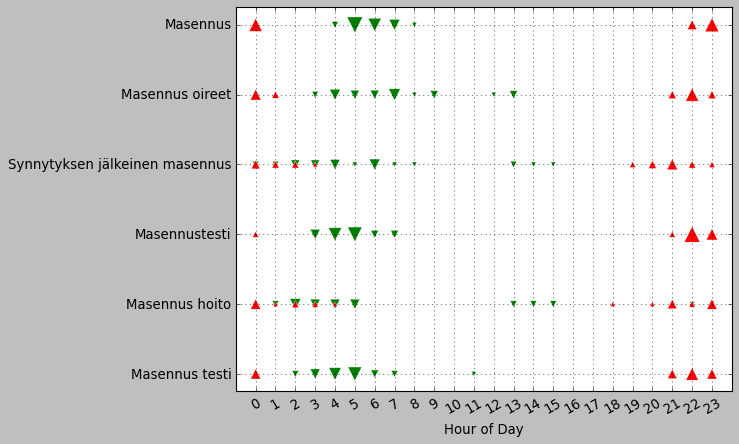

In [19]:
term = terms_first_five
plot_count_max_min(dfmin, dfmax, term)

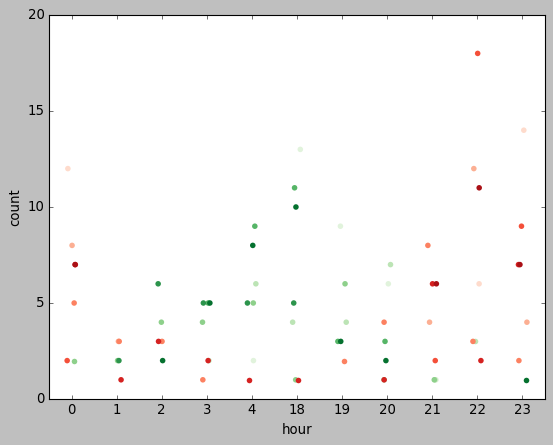

In [20]:
fig, ax = plt.subplots()
sns.stripplot(data=dfmin, x='hour', y='count', hue='term', 
              palette = 'Greens', ax = ax)
sns.stripplot(data=dfmax, x='hour', y='count', hue='term',  
              palette = 'Reds', ax = ax)
ax.legend().set_visible(False)
plt.show()

In [21]:
# bellow we wan not plot the count but  to have all above and bellow daily mean for each term during for 31 days

In [22]:
""" other approach is to make a dictioary of all above mean of daily max hours for each term"""
def hours_of_max_daily_rsv(df_agg_day_hour, terms):
    df = df_agg_day_hour[:]
    dict_above_max = dict()
    for term in terms:
        seri_mean = df.groupby(['hour','day'])[term].mean()
        # to make wide view from long one, filed representing days of 31 days of month and records repreenting hours of a day
        df_mean = seri_mean.unstack()
        # we want to know what is the minimum RSV for each day to then understand which hours it happens
        daily_maxs = df_mean.max()
        max_index_days = []
        # to find minum for each day
        for day in range(1,32):
            max_hours = df_mean.loc[:,day] >= daily_maxs[day] # to find hours in the day which is equal to minum searches of the day
            max_index =max_hours.index[max_hours].tolist()
            max_index_days.extend(max_index)
        dict_above_max[term] = max_index_days
        # make a dataframe of the dictionary and reset the index so the index which actuly indicating hours to be a column
        df_ = pd.DataFrame.from_dict(dict_above_max, orient='index')
        df_.reset_index(inplace = True)
        # make a long view of it 
        df_max = df_.melt(id_vars = 'index',var_name = 'day' )
        # remove the nan values
        df_max.dropna(inplace = True)
        df_max.drop(['day'], axis = 1, inplace = True)
        df_max.columns = ['term','hour']
    return df_max

In [23]:
terms = terms_first_five
df_max_hours = hours_of_max_daily_rsv(df_agg_day_hour, terms)
df_max_hours.head()

,term,hour
0,masennus,23.0
1,masennus oireet,21.0
2,synnytyksen jälkeinen masennus,22.0
3,masennustesti,22.0
4,masennus hoito,23.0


In [24]:
""" other approach is to make a dictioary of all above mean of daily max hours for each term"""
def hours_of_min_daily_rsv(df_agg_day_hour, terms):
    df = df_agg_day_hour[:]
    dict_min = dict()
    for term in terms:
        seri_mean = df.groupby(['hour','day'])[term].mean()
        # to make wide view from long one, filed representing days of 31 days of month and records repreenting hours of a day
        df_mean = seri_mean.unstack()
        # we want to know what is the minimum RSV for each day to then understand which hours it happens
        daily_mins = df_mean.min()
        min_index_days = []
        # to find minum for each day
        for day in range(1,32):
            min_hours = df_mean.loc[:,day] <= daily_mins[day] # to find hours in the day which is equal to minum searches of the day
            min_index =min_hours.index[min_hours].tolist()
            min_index_days.extend(min_index)
        dict_min[term] = min_index_days
        # make a dataframe of the dictionary and reset the index so the index which actuly indicating hours to be a column
        df_ = pd.DataFrame.from_dict(dict_min, orient='index')
        df_.reset_index(inplace = True)
        # make a long view of it 
        df_min = df_.melt(id_vars = 'index',var_name = 'day' )
        # remove the nan values
        df_min.dropna(inplace = True)
        df_min.drop(['day'], axis = 1, inplace = True)
        df_min.columns = ['term','hour']
    return df_min

In [25]:
df_min_hours = hours_of_min_daily_rsv(df_agg_day_hour, terms)
df_min_hours.head()

,term,hour
0,masennus,5
1,masennus oireet,7
2,synnytyksen jälkeinen masennus,6
3,masennustesti,4
4,masennus hoito,3


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


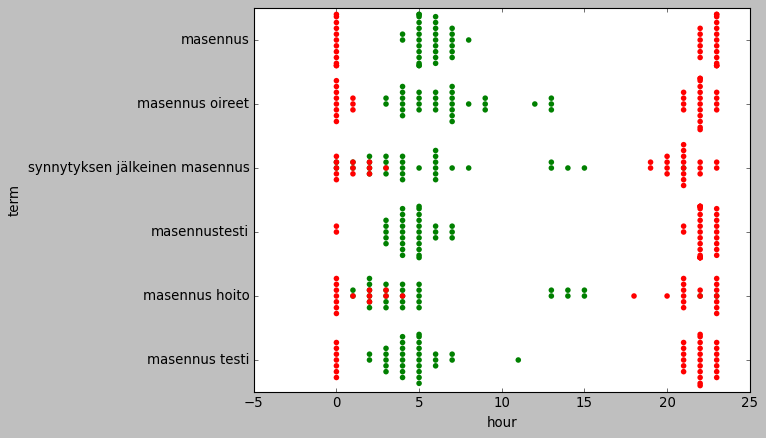

In [26]:
fig, ax = plt.subplots()
sns.swarmplot(data=df_min_hours, x='hour', y='term', 
              color = 'g', ax = ax)
sns.swarmplot(data=df_max_hours, x='hour', y='term',  
              color = 'r', ax = ax)
# ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
ax.legend().set_visible(False)
plt.show()

In [27]:
# as there is hozental distinct disctance, to remove the columns and rows we'll jitter the data to break up the columns and rows.
df_min_hours['jitter'] = df_min_hours['hour']+np.random.normal(0,1,size = len(df_min_hours))
df_max_hours['jitter'] = df_max_hours['hour']+np.random.normal(0,1,size = len(df_max_hours))

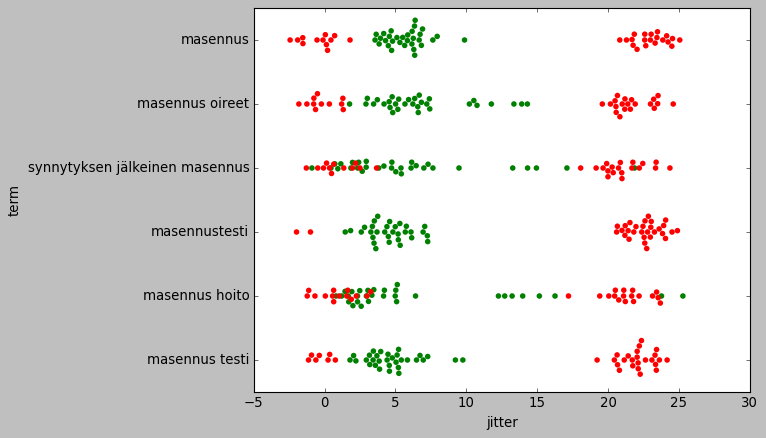

In [28]:
fig, ax = plt.subplots()
sns.swarmplot(data=df_min_hours, x='jitter', y='term', 
              color = 'g', ax = ax)
sns.swarmplot(data=df_max_hours, x='jitter', y='term',  
              color = 'r', ax = ax)
# # ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# ax.legend().set_visible(False)
plt.show()

# distributin of ranks in daily hours

In [29]:
df_agg.head()

,year,month,day,hour,week,day_month,year_month_day,weekday,masennus,masennus oireet,synnytyksen jälkeinen masennus,masennustesti,masennus hoito,masennus testi
date,,,,,,,,,,,,,,
2015-01-01 00:00:00,2015,Jan,1,0,1,01-Jan,2015-1-1,Thurs,22.0,11.0,0.0,17.0,0.0,0.0
2015-01-01 01:00:00,2015,Jan,1,1,1,01-Jan,2015-1-1,Thurs,18.0,0.0,0.0,12.0,0.0,0.0
2015-01-01 02:00:00,2015,Jan,1,2,1,01-Jan,2015-1-1,Thurs,31.0,12.0,12.0,18.0,0.0,100.0
2015-01-01 03:00:00,2015,Jan,1,3,1,01-Jan,2015-1-1,Thurs,14.0,16.0,0.0,0.0,0.0,0.0
2015-01-01 04:00:00,2015,Jan,1,4,1,01-Jan,2015-1-1,Thurs,8.0,0.0,0.0,0.0,0.0,0.0


# hourly plot

# Lets make slices for every 24 hours

In [30]:
term = terms_first_five

In [31]:
""" to add a column representing all unique days of the data(day-month-year) with an integer and then add another column
to indeicate daily mean value for each day for each term and finaly to present it in long view"""
def each_days_hours(df_agg, term):
    # make a list of all days with length of the dataframe and add it to the datframe a s column
    num_days = int(len(df_agg)/24)
    days = [[i]*24 for i in np.arange(1,num_days+1)] # a list of list to repeat a same day for every 24 hours
    all_day = [l for i in days for l in i] # to make a list of list of list
    df_agg_ = df_agg[:]
    df_agg_.insert(0,'all_day', all_day)  
    n = len(term) # number of terms
    # the last columns are terms
    df_agg_melted = pd.melt(df_agg_, id_vars=['all_day','hour'], value_vars=df_agg.iloc[:,-n:], var_name='term', 
                        value_name='rsv', ignore_index=False)
    # to change tyoe data of all_day to category
    df_agg_melted['all_day'].astype('category')
    ## we want to add a column with daily mean 
    df_agg_melted = df_agg_melted.fillna(0) # replace nan with zero
    daily_mean = df_agg_melted.groupby(['term','all_day'])['rsv'].mean()
    df_daily_mean = daily_mean.unstack() # has a columns for each day( in total of six yeras = 2196) with index of term
    # repeat a value for each term 24 times to have a daily mean for all hours
    r = []
    for j in term:
        # for each term there are 2192 days, we want to repeat each element for 24 hours then to add it to df_agg_melted dataframe
        r.extend([np.ones(24, dtype=int)*int(i) for i in df_daily_mean.loc[j,:]])
    mean_daily = [i for d in r for i in d]
    df_agg_melted.insert(4,'daily_mean', mean_daily)
    return df_agg_melted

In [32]:
term = terms_first_five
df_all_days = each_days_hours(df_agg, term)
df_all_days.iloc[52600:52615] # to just see a slice when terms change

,all_day,hour,term,rsv,daily_mean
date,,,,,
2020-12-31 16:00:00,2192,16,masennus,24.0,27
2020-12-31 17:00:00,2192,17,masennus,20.0,27
2020-12-31 18:00:00,2192,18,masennus,15.0,27
2020-12-31 19:00:00,2192,19,masennus,19.0,27
2020-12-31 20:00:00,2192,20,masennus,23.0,27
2020-12-31 21:00:00,2192,21,masennus,14.0,27
2020-12-31 22:00:00,2192,22,masennus,30.0,27
2020-12-31 23:00:00,2192,23,masennus,16.0,27
2015-01-01 00:00:00,1,0,masennus oireet,11.0,5


In [33]:
import seaborn as sns
sns.set_context("paper")
def plot_hourly_terms(df_all_days, terms,x= 'hour', y = 'rsv',col = 'term', subtitles = terms):
    g = sns.relplot(data=df_all_days, x=x, y=y, hue='all_day',
                 col=col, col_wrap=3, 
                palette='ocean',legend=False, 
                kind='line',estimator='mean', height=5, aspect=1)
     
    g.set_titles(col_template='') # ,x = .58,y = 1.05
    # dataframe of mean of hourly RSV for each term
    df_ = df_all_days.groupby([col, x],sort=False)[y].mean()
    df_ = df_.unstack()    
    for i,tr in enumerate(terms):
        df_.loc[tr,:].plot.line(ax = g.axes.flatten()[i], color = 'teal', linewidth = '3') 
    for i in range(0,6):
        g.axes.flatten()[-i].set_xticks(range(0,24,2))
        g.axes.flatten()[-i].set_xticklabels(list(range(0,24,2)), rotation = 30, size = 'medium')
        g.axes.flatten()[i].set_title(subtitles[i], fontsize = 20, loc='center',y = 1.01)
        

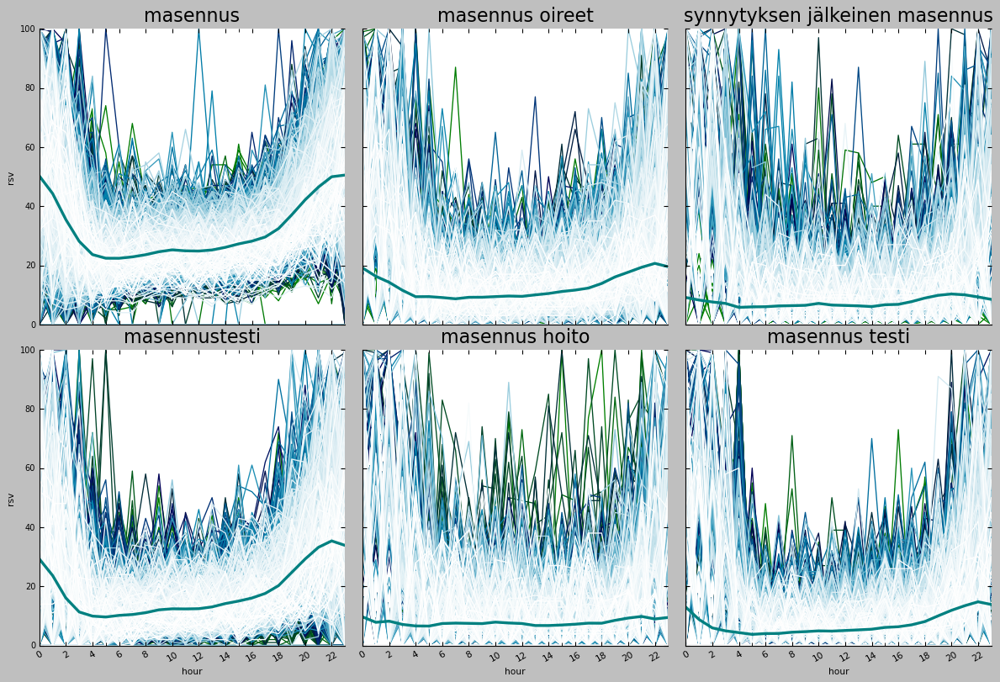

In [34]:
terms = terms_first_five 
plot_hourly_terms(df_all_days, terms)

In [35]:
import seaborn as sns
sns.set_context("paper")
def scatter_hourly_terms(df_all_days, terms,x= 'hour', y = 'rsv',col = 'term', subtitles = terms):
    # to amke it smooth we add a jitter
    df_all_days['hour']= df_all_days['hour'].astype('int')
    df_all_days['jitter_hour'] = df_all_days['hour']+np.random.normal(0,1,size = len(df_all_days))
    x = 'jitter_hour'
    g = sns.relplot(data=df_all_days, x=x, y=y, hue='all_day',
                 col=col, col_wrap=3, 
                palette='tab20c',legend=False, 
                kind='scatter',estimator='mean', height=5, aspect=1, alpha = .3)
     
    g.set_titles(col_template='') # ,x = .58,y = 1.05
    # dataframe of mean of hourly RSV for each term
    df_ = df_all_days.groupby([col, 'hour'],sort=False)[y].mean()
    df_ = df_.unstack()    
    for i,tr in enumerate(terms):
        df_.loc[tr,:].plot.line(ax = g.axes.flatten()[i], color = 'orange', linewidth = '2') 
    for i in range(0,6):
        g.axes.flatten()[-i].set_xticks(range(0,24,2))
        g.axes.flatten()[-i].set_xticklabels(list(range(0,24,2)), rotation = 30, size = 'medium')
        g.axes.flatten()[i].set_title(subtitles[i], fontsize = 15, loc='center',y = 1.01)
        g.axes.flatten()[i].set_xlim(-1,24)
        g.axes.flatten()[i].set_ylim(-1,106)
        

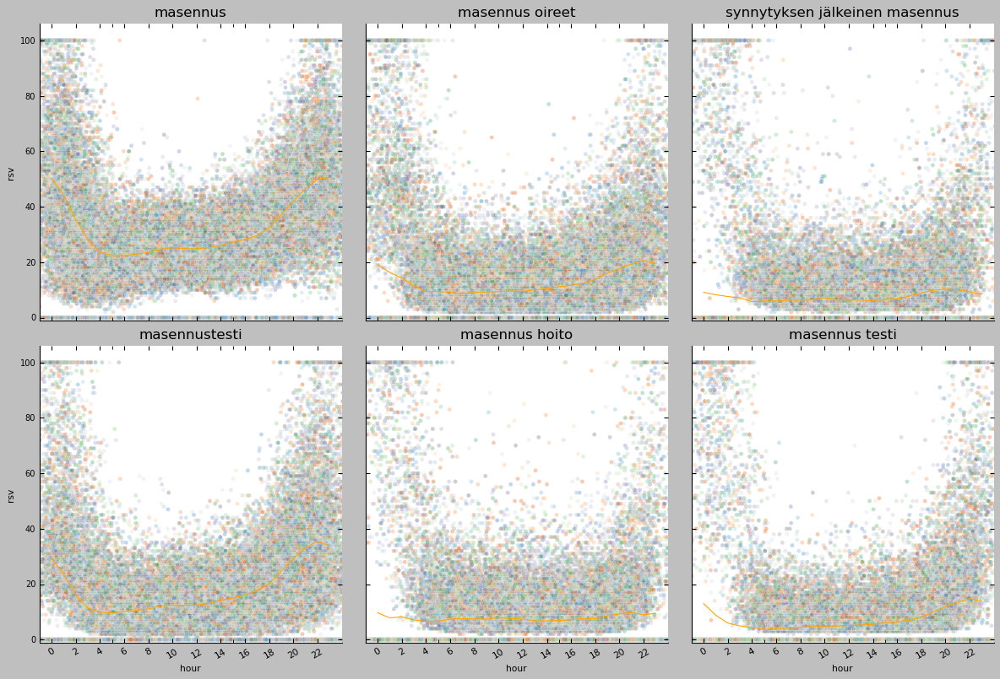

In [36]:
scatter_hourly_terms(df_all_days, terms,x= 'hour', y = 'rsv',col = 'term', subtitles = terms)

In [37]:
## smooth the plot with rolling window mean

In [38]:
""" to create a dataframe of the terms' rsv and then add a column of rolling rsvs for ech term """
from functools import reduce
def each_term_df_merge(df_all_days, term, window):
    dict_df = {}
    for tr in term:
        df_tr = df_all_days.loc[df_all_days.term == tr,['all_day','hour','rsv','daily_mean']]
        df_tr['rolling'] = df_tr['rsv'].rolling(window).mean()
        df_tr.columns = ['all_day','hour',f'{tr}',f'daily_mean_{tr}', f'rolling_{tr}']
        df_tr = df_tr.fillna(0)
        dict_df[tr] = df_tr
    dfs = [i for i in dict_df.values()]
    df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['date','all_day','hour'],
                                            how='inner'), dfs)
    return df_merged
    

In [39]:
df_merged = each_term_df_merge(df_all_days, term,3)
df_merged.head()

,all_day,hour,masennus,daily_mean_masennus,rolling_masennus,masennus oireet,daily_mean_masennus oireet,rolling_masennus oireet,synnytyksen jälkeinen masennus,daily_mean_synnytyksen jälkeinen masennus,rolling_synnytyksen jälkeinen masennus,masennustesti,daily_mean_masennustesti,rolling_masennustesti,masennus hoito,daily_mean_masennus hoito,rolling_masennus hoito,masennus testi,daily_mean_masennus testi,rolling_masennus testi
date,,,,,,,,,,,,,,,,,,,,
2015-01-01 00:00:00,1,0,22.0,19,0.000000,11.0,5,0.000000,0.0,2,0.0,17.0,12,0.000000,0.0,0,0.0,0.0,8,0.000000
2015-01-01 01:00:00,1,1,18.0,19,0.000000,0.0,5,0.000000,0.0,2,0.0,12.0,12,0.000000,0.0,0,0.0,0.0,8,0.000000
2015-01-01 02:00:00,1,2,31.0,19,23.666667,12.0,5,7.666667,12.0,2,4.0,18.0,12,15.666667,0.0,0,0.0,100.0,8,33.333333
2015-01-01 03:00:00,1,3,14.0,19,21.000000,16.0,5,9.333333,0.0,2,4.0,0.0,12,10.000000,0.0,0,0.0,0.0,8,33.333333
2015-01-01 04:00:00,1,4,8.0,19,17.666667,0.0,5,9.333333,0.0,2,4.0,0.0,12,6.000000,0.0,0,0.0,0.0,8,33.333333


### to create a datframe of terms and their rolling avarage rsvs

In [40]:
term = terms_first_five
name_rolling = [f'rolling_{tr}' for tr in term]
name_rolling

['rolling_masennus',
 'rolling_masennus oireet',
 'rolling_synnytyksen jälkeinen masennus',
 'rolling_masennustesti',
 'rolling_masennus hoito',
 'rolling_masennus testi']

In [41]:
# create a long view of the datframe of rolling rsvs
f_rolling = df_merged.melt(id_vars = ['all_day','hour'], value_vars = name_rolling, value_name='rolling_rsv',var_name = 'term',
                   ignore_index=False )

In [42]:
f_rolling.head()

,all_day,hour,term,rolling_rsv
date,,,,
2015-01-01 00:00:00,1,0,rolling_masennus,0.000000
2015-01-01 01:00:00,1,1,rolling_masennus,0.000000
2015-01-01 02:00:00,1,2,rolling_masennus,23.666667
2015-01-01 03:00:00,1,3,rolling_masennus,21.000000
2015-01-01 04:00:00,1,4,rolling_masennus,17.666667


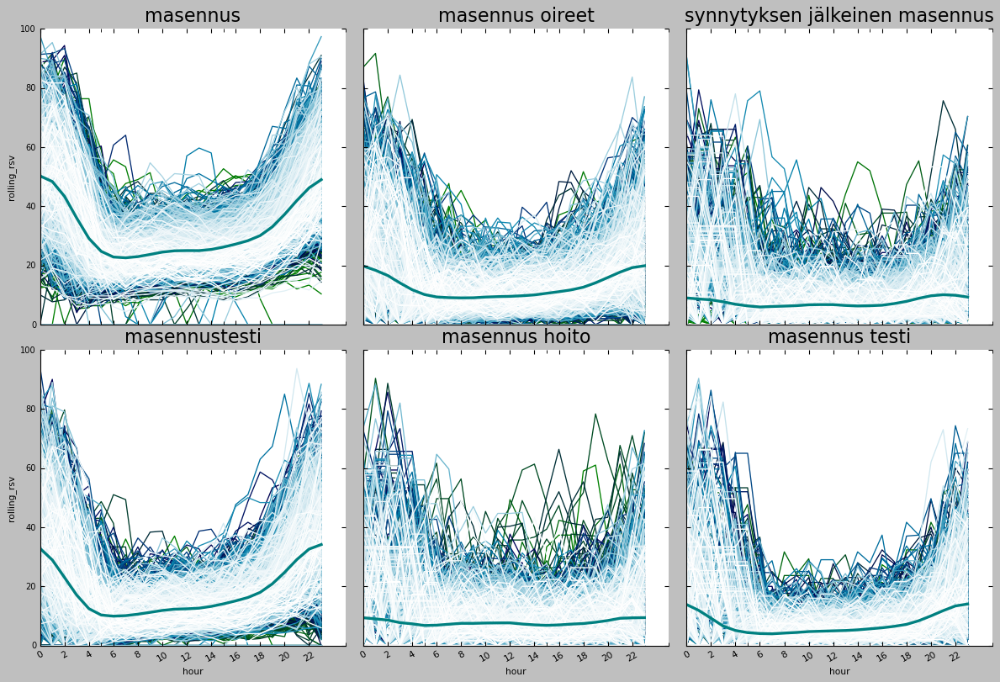

In [43]:
# plot the rolling average with window = 3
terms = name_rolling
subtitles = terms_first_five
plot_hourly_terms(f_rolling, terms,x= 'hour', y = 'rolling_rsv',col = 'term', subtitles = subtitles)

### rolling window = 2

In [44]:
df_merged = each_term_df_merge(df_all_days, term,2)
term = terms_first_five
name_rolling = [f'rolling_{tr}' for tr in term]
# create a long view of the datframe of rolling rsvs
f_rolling = df_merged.melt(id_vars = ['all_day','hour'], value_vars = name_rolling, value_name='rolling_rsv',var_name = 'term',
                   ignore_index=False )

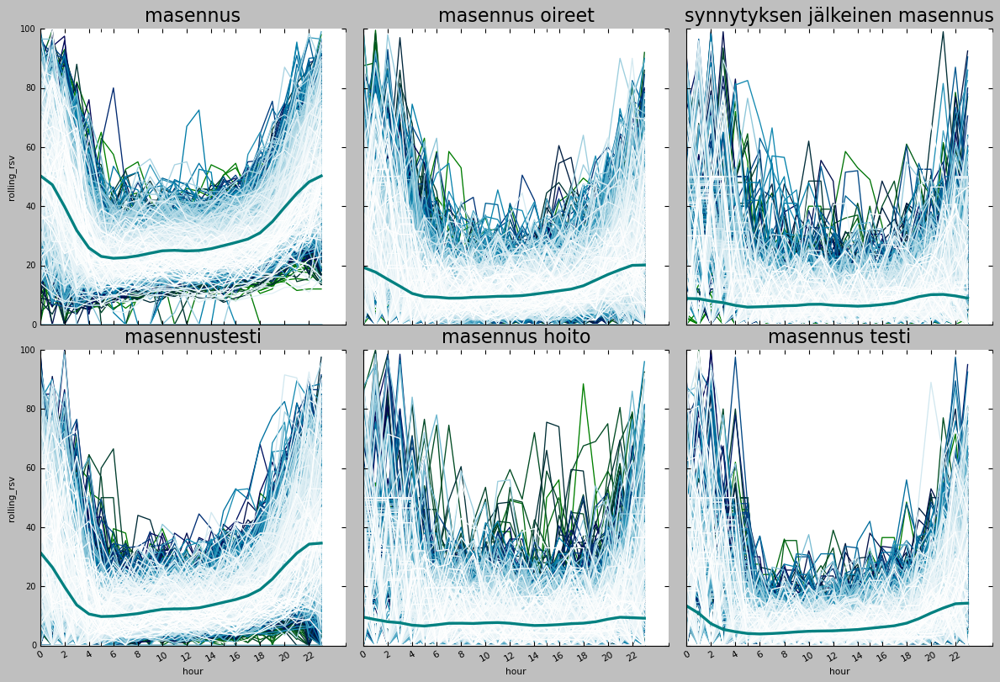

In [45]:
# plot the rolling average with window = 2
terms = name_rolling
subtitles = terms_first_five
plot_hourly_terms(f_rolling, terms,x= 'hour', y = 'rolling_rsv',col = 'term', subtitles = subtitles)

### Rolling window =4

In [46]:
df_merged = each_term_df_merge(df_all_days, term,4)
term = terms_first_five
name_rolling = [f'rolling_{tr}' for tr in term]
# create a long view of the datframe of rolling rsvs
f_rolling = df_merged.melt(id_vars = ['all_day','hour'], value_vars = name_rolling, value_name='rolling_rsv',var_name = 'term',
                   ignore_index=False )

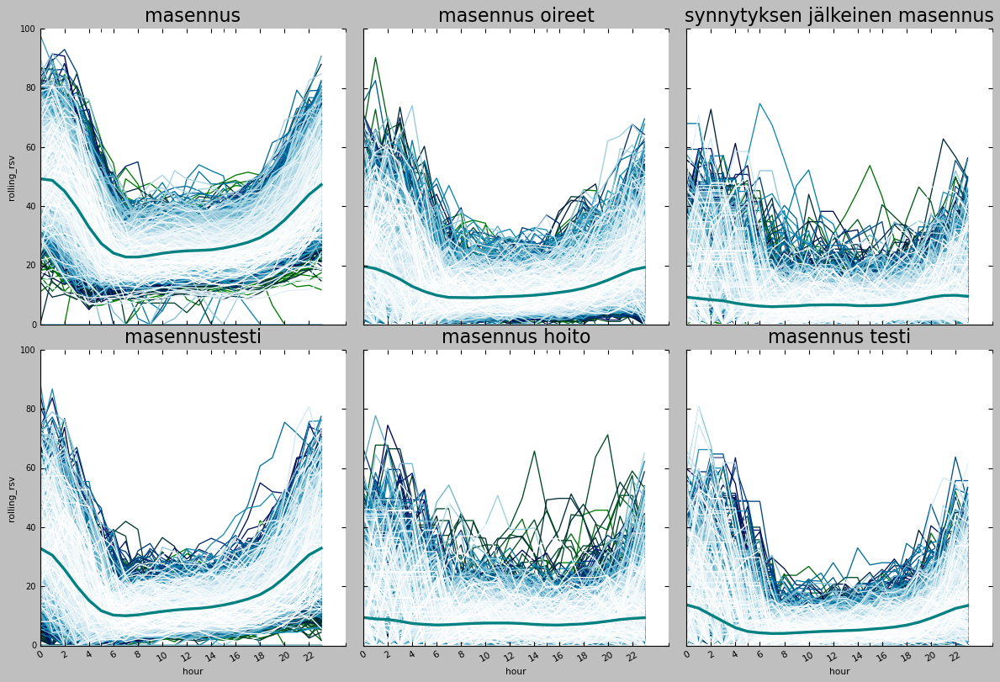

In [47]:
# plot the rolling average with window = 4
terms = name_rolling
subtitles = terms_first_five
plot_hourly_terms(f_rolling, terms,x= 'hour', y = 'rolling_rsv',col = 'term', subtitles = subtitles)

# Daily plot in 31 days ( a month)

In [51]:
df_agg.head()

,year,month,day,hour,week,day_month,year_month_day,weekday,masennus,masennus oireet,synnytyksen jälkeinen masennus,masennustesti,masennus hoito,masennus testi
date,,,,,,,,,,,,,,
2015-01-01 00:00:00,2015,Jan,1,0,1,01-Jan,2015-01-01,Thurs,22.0,11.0,0.0,17.0,0.0,0.0
2015-01-01 01:00:00,2015,Jan,1,1,1,01-Jan,2015-01-01,Thurs,18.0,0.0,0.0,12.0,0.0,0.0
2015-01-01 02:00:00,2015,Jan,1,2,1,01-Jan,2015-01-01,Thurs,31.0,12.0,12.0,18.0,0.0,100.0
2015-01-01 03:00:00,2015,Jan,1,3,1,01-Jan,2015-01-01,Thurs,14.0,16.0,0.0,0.0,0.0,0.0
2015-01-01 04:00:00,2015,Jan,1,4,1,01-Jan,2015-01-01,Thurs,8.0,0.0,0.0,0.0,0.0,0.0


In [52]:
""" to add a column representing all unique month during the years of the data with an 
integer and then add another columnto indeicate daily mean value for each day for each 
term and finaly to present it in long view"""
def each_months_days(df_agg, start_year, last_year, terms):
    # chnage dtype of the column 'year-month-day' to datetime
    df_agg['year_month_day'] =  pd.to_datetime(df_agg['year_month_day'], format='%Y-%m-%d')
    # make a dictionary for projection of years on values ranging from zero to 12*len(last_year) for every 12 values, as there are 12 months in each year and we want to have aall months at the end of the years
    n_y= last_year-start_year+1
    year_num_proj = {key:value for key,value in zip(range(start_year,last_year+1), range(0,n_y*12,12))}
    # {2015: 0, 2016: 12, 2017: 24, 2018: 36, 2019: 48, 2020:72}
    # make a dictionary for projection of months on values ranging from one to 12
    month_list = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
    month_num_proj = {key:value for key,value in zip(month_list, range(1,13))}
    #{'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6, 'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12}
    # make a copy of the dataframe
    df_agg1 = df_agg[:]
    # replace year with the values of the projection dictionary
    df_agg1.replace({"year": year_num_proj}, inplace = True)
    df_agg1['year'] = df_agg1['year'].astype('int32')
    # replace month with the values of the projection dictionary
    df_agg1.replace({"month": month_num_proj}, inplace = True)
    df_agg1['month'] = df_agg1['month'].astype('int32')
#     print(df_agg1)
    # add a new columns indication sum of the replaced moth and year to have all months during the years 
    year_month_num = (df_agg1['year']+ df_agg1['month'])
#     print(year_month_num)
    df_agg1.insert(0,'year_month_num', year_month_num)
    # select columns for taking mean including alll terms and the newly added columns for months
    df_agg1['day'] = df_agg1['day'].astype('int32') # change type of day from category to int, to take mean
    names = terms+['year_month_num','day']
    df_g = df_agg1.groupby('year_month_day')[names].mean()
    # create long view of the dataframe
    n = len(terms)
    df_agg_melted = pd.melt(df_g, id_vars=['year_month_num','day'], value_vars=df_g.iloc[:,:n], var_name='term', 
                        value_name='rsv', ignore_index=False)
    return df_agg_melted

In [55]:
terms = terms_first_five
df_monthly = each_months_days(df_agg, 2015, 2020, terms)
df_monthly.head()

,year_month_num,day,term,rsv
year_month_day,,,,
2015-01-01,1.0,1.0,masennus,19.458333
2015-01-02,1.0,2.0,masennus,18.833333
2015-01-03,1.0,3.0,masennus,25.208333
2015-01-04,1.0,4.0,masennus,25.875000
2015-01-05,1.0,5.0,masennus,23.291667


 ### plot the monthly variation vs days 

In [74]:
import seaborn as sns
sns.set_context("paper")
def plot_hourly_terms(df_monthly, terms,x= 'day', y = 'rsv',col = 'term', subtitles = terms):
    g = sns.relplot(data=df_monthly, x=x, y=y, hue='year_month_num',
                 col=col, col_wrap=3, 
                palette='ocean',legend=False, 
                kind='line',estimator='mean', height=5, aspect=1)
    n = len(terms) 
    g.set_titles(col_template='') # ,x = .58,y = 1.05
    # dataframe of mean of hourly RSV for each term
    df_ = df_monthly.groupby([col, x],sort=False)[y].mean()
    df_ = df_.unstack()    
    for i,tr in enumerate(terms):
        df_.loc[tr,:].plot.line(ax = g.axes.flatten()[i], color = 'teal', linewidth = '3') 
    for i in range(0,n):
        g.axes.flatten()[-i].set_xticks(range(0,32,2))
        g.axes.flatten()[-i].set_xticklabels(list(range(0,32,2)), rotation = 30, size = 'medium')
        g.axes.flatten()[i].set_title(subtitles[i], fontsize = 20, loc='center',y = 1.01)
        g.axes.flatten()[i].set_xlim(1,31)
        g.axes.flatten()[i].set_ylim(0,60)
        

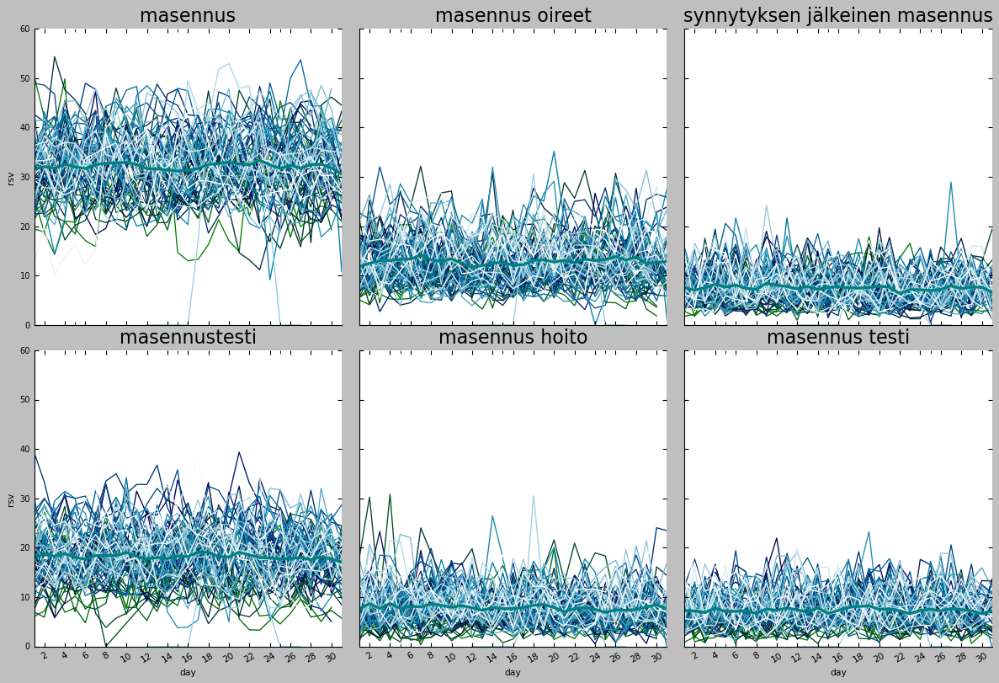

In [75]:
plot_hourly_terms(df_monthly, terms,x= 'day', y = 'rsv',col = 'term', subtitles = terms)

In [78]:
import seaborn as sns
sns.set_context("paper")
def plot_hourly_terms_scatter(df_monthly, terms,x= 'day', y = 'rsv',col = 'term', subtitles = terms):
    df_monthly['day_jitter'] = df_monthly['day'] + np.random.normal(0,1,size = len(df_monthly))
    x = 'day_jitter'
    g = sns.relplot(data=df_monthly, x=x, y=y, hue='year_month_num',
                 col=col, col_wrap=3, 
                palette='tab20c',legend=False, 
                kind='scatter',estimator='mean', height=5, aspect=1)
    n = len(terms) 
    g.set_titles(col_template='') # ,x = .58,y = 1.05
    # dataframe of mean of hourly RSV for each term
    df_ = df_monthly.groupby([col, 'day'],sort=False)[y].mean()
    df_ = df_.unstack()    
    for i,tr in enumerate(terms):
        df_.loc[tr,:].plot.line(ax = g.axes.flatten()[i], color = 'orange', linewidth = '2') 
    for i in range(0,n):
        g.axes.flatten()[-i].set_xticks(range(0,32,2))
        g.axes.flatten()[-i].set_xticklabels(list(range(0,32,2)), rotation = 30, size = 'medium')
        g.axes.flatten()[i].set_title(subtitles[i], fontsize = 15, loc='center',y = 1.01)
        g.axes.flatten()[i].set_xlim(0,31)
        g.axes.flatten()[i].set_ylim(0,60)
        

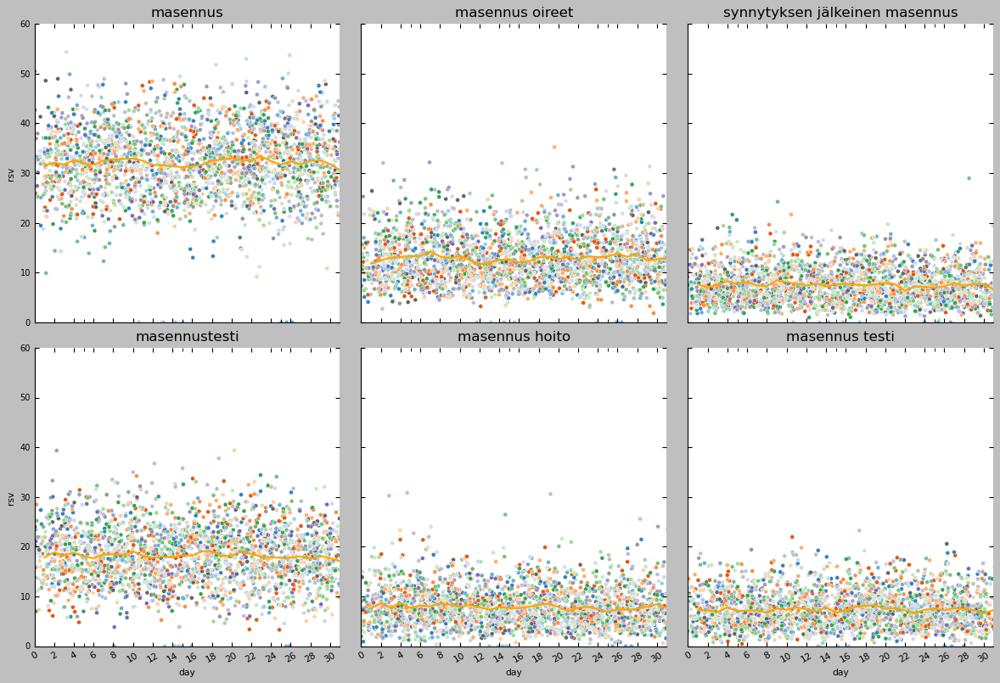

In [79]:
plot_hourly_terms_scatter(df_monthly, terms,x= 'day', y = 'rsv',col = 'term', subtitles = terms)

 # monthly variation based vs hours 

In [80]:
""" to add a column representing all unique month during the years of the data with an 
integer and then add another columnto indeicate hours  for each day for each 
term and finaly to present it in long view"""
def each_month_hours(df_agg, start_year, last_year, term):
    # chnage dtype of the column 'year-month-day' to datetime
    df_agg['year_month_day'] =  pd.to_datetime(df_agg['year_month_day'], format='%Y-%m-%d')
    # make a dictionary for projection of years on values ranging from zero to 12*len(last_year) for every 12 values, as there are 12 months in each year and we want to have aall months at the end of the years
    n_y= last_year-start_year+1
    year_num_proj = {key:value for key,value in zip(range(start_year,last_year+1), range(0,n_y*12,12))}
    # {2015: 0, 2016: 12, 2017: 24, 2018: 36, 2019: 48, 2020:72}
    # make a dictionary for projection of months on values ranging from one to 12
    month_list = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
    month_num_proj = {key:value for key,value in zip(month_list, range(1,13))}
    #{'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5, 'Jun': 6, 'Jul': 7, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12}
    # make a copy of the dataframe
    df_agg1 = df_agg[:]
    # replace year with the values of the projection dictionary
    df_agg1.replace({"year": year_num_proj}, inplace = True)
    df_agg1['year'] = df_agg1['year'].astype('int32')
    # replace month with the values of the projection dictionary
    df_agg1.replace({"month": month_num_proj}, inplace = True)
    df_agg1['month'] = df_agg1['month'].astype('int32')
#     print(df_agg1)
    # add a new columns indication sum of the replaced moth and year to have all months during the years 
    year_month_num = (df_agg1['year']+ df_agg1['month'])
    df_agg1.insert(0,'year_month_num', year_month_num)
    # select columns for taking mean including alll terms and the newly added columns for months
    df_agg1['day'] = df_agg1['day'].astype('int32') # change type of day from category to int, to take mean
    # add a columns of dy-hour which considering months of the year makes it a unique record identification
    df_agg1['day_hour'] = [f'{d}-{h}' for d,h in zip(df_agg1['day'], df_agg1['hour'])]
    names = terms+['year_month_num','day_hour']
    df_g = df_agg1[names]
    # create long view of the dataframe
    n = len(terms)
    df_agg_melted = pd.melt(df_g, id_vars=['year_month_num','day_hour'], value_vars=df_g.iloc[:,:n], var_name='term', 
                        value_name='rsv', ignore_index=False)
    return df_agg_melted

In [81]:
df_hourly_monthly = each_month_hours(df_agg, 2015, 2020, terms)
df_hourly_monthly.head()

,year_month_num,day_hour,term,rsv
date,,,,
2015-01-01 00:00:00,1,1-0,masennus,22.0
2015-01-01 01:00:00,1,1-1,masennus,18.0
2015-01-01 02:00:00,1,1-2,masennus,31.0
2015-01-01 03:00:00,1,1-3,masennus,14.0
2015-01-01 04:00:00,1,1-4,masennus,8.0


In [82]:
import seaborn as sns
sns.set_context("paper")
def plot_hourly_terms(df_hourly_monthly, terms,x= 'day_hour', y = 'rsv',col = 'term', subtitles = terms):
    g = sns.relplot(data=df_hourly_monthly, x=x, y=y, hue='year_month_num',
                 col=col, col_wrap=2, 
                palette='ocean',legend=False, 
                kind='line',estimator='mean', height=5, aspect=2)
    n = len(terms) 
    g.set_titles(col_template='') 
    # dataframe of mean of hourly RSV for each term
    df_ = df_hourly_monthly.groupby([col, x],sort=False)[y].mean()
    df_ = df_.unstack()    
    for i,tr in enumerate(terms):
        df_.loc[tr,:].plot.line(ax = g.axes.flatten()[i], color = 'teal', linewidth = '3') 
    for i in range(0,n):
        g.axes.flatten()[-i].set_xticks(range(0,24*31,24))
        g.axes.flatten()[-i].set_xticklabels(list(range(0,31)), rotation = 30, size = 'medium')
        g.axes.flatten()[i].set_title(subtitles[i], fontsize = 20, loc='center',y = 1.01)
        g.axes.flatten()[i].set_ylim(0,106)
        

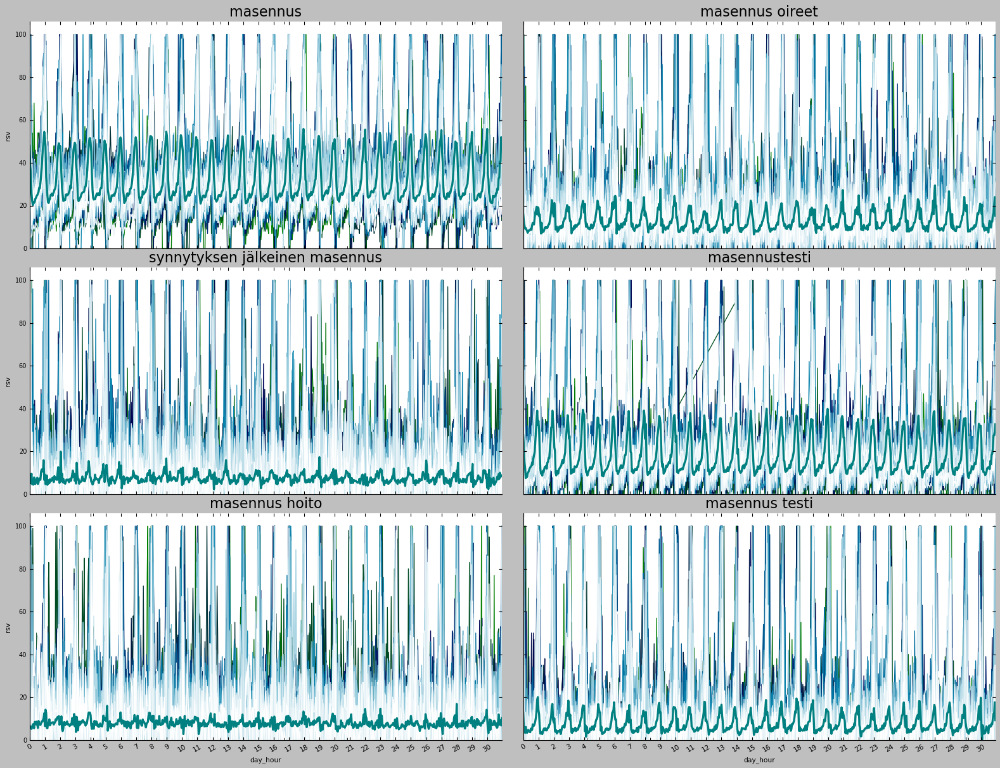

In [83]:
plot_hourly_terms(df_hourly_monthly, terms,x= 'day_hour', y = 'rsv',col = 'term', subtitles = terms)

In [84]:
import seaborn as sns
sns.set_context("talk")
def plot_hourly_terms(df_hourly_monthly, terms,x= 'day_hour', y = 'rsv',col = 'term', subtitles = terms):
    g = sns.relplot(data=df_hourly_monthly, x=x, y=y, hue='year_month_num',
                 col=col, col_wrap=1, 
                palette='ocean',legend=False, 
                kind='line',estimator='mean', height=2, aspect=6)
    n = len(terms) 
    g.set_titles(col_template='') 
    # dataframe of mean of hourly RSV for each term
    df_ = df_hourly_monthly.groupby([col, x],sort=False)[y].mean()
    df_ = df_.unstack()    
    for i,tr in enumerate(terms):
        df_.loc[tr,:].plot.line(ax = g.axes.flatten()[i], color = 'orange', linewidth = '1') 
    for i in range(0,n):
        g.axes.flatten()[-i].set_xticks(range(0,24*31,24))
        g.axes.flatten()[-i].set_xticklabels(list(range(0,31)), rotation = 30, size = 'medium')
        g.axes.flatten()[i].set_title(subtitles[i], fontsize = 20, loc='center',y = 1.01)
        g.axes.flatten()[i].set_ylim(0,106)
        

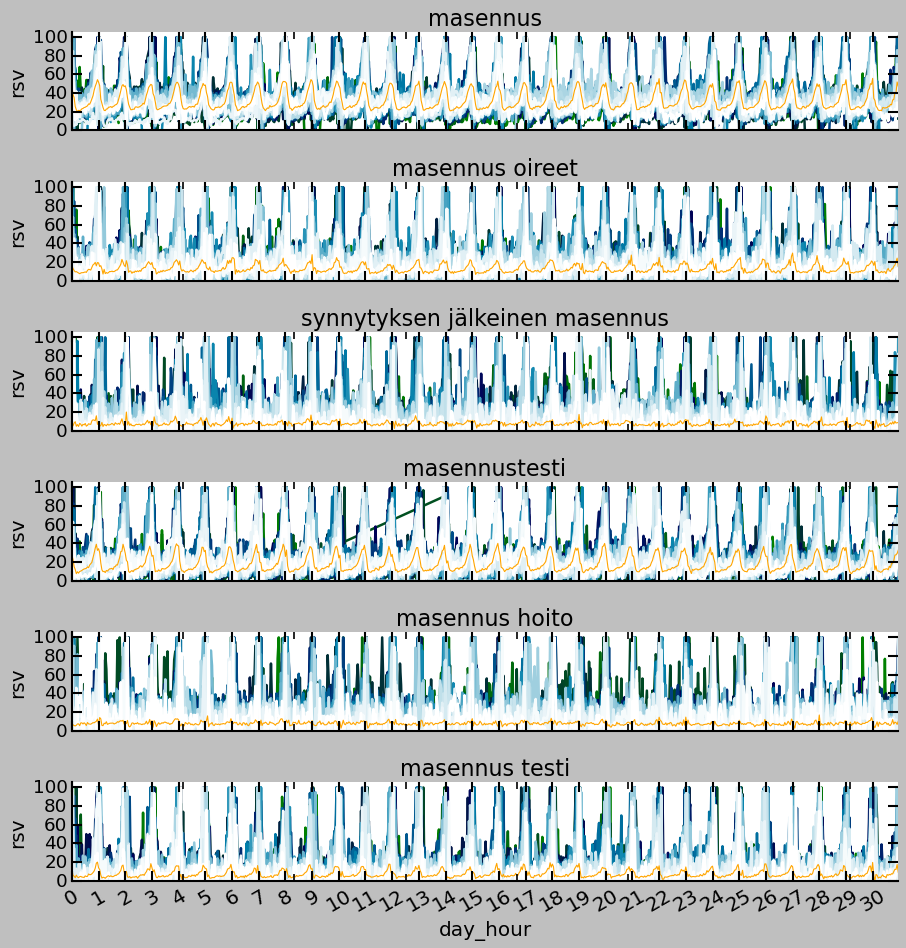

In [85]:
plot_hourly_terms(df_hourly_monthly, terms,x= 'day_hour', y = 'rsv',col = 'term', subtitles = terms)

In [114]:
import seaborn as sns
sns.set_context("paper")
def scatter_hourly_terms(df_hourly_monthly, terms,x= 'day_hour', y = 'rsv',col = 'term', subtitles = terms):
    g = sns.relplot(data=df_hourly_monthly, x=x, y=y, hue='year_month_num',
                 col=col, col_wrap=1, 
                palette='tab20c',legend=False, 
                kind='scatter',estimator='mean', height=2, aspect=6, alpha = .2)
    n = len(terms) 
    g.set_titles(col_template='') 
    # dataframe of mean of hourly RSV for each term
    df_ = df_hourly_monthly.groupby([col, x],sort=False)[y].mean()
    df_ = df_.unstack()    
    for i,tr in enumerate(terms):
        df_.loc[tr,:].plot.line(ax = g.axes.flatten()[i], color = 'orange', linewidth = '2') 
    for i in range(0,n):
        g.axes.flatten()[-i].set_xticks(range(0,24*31,24))
        g.axes.flatten()[-i].set_xticklabels(list(range(0,31)), rotation = 30, size = 'medium')
        g.axes.flatten()[i].set_title(subtitles[i], fontsize = 20, loc='center',y = 1.01)
        g.axes.flatten()[i].set_ylim(0,106)
        g.axes.flatten()[i].set_xlim(-1,24*31)

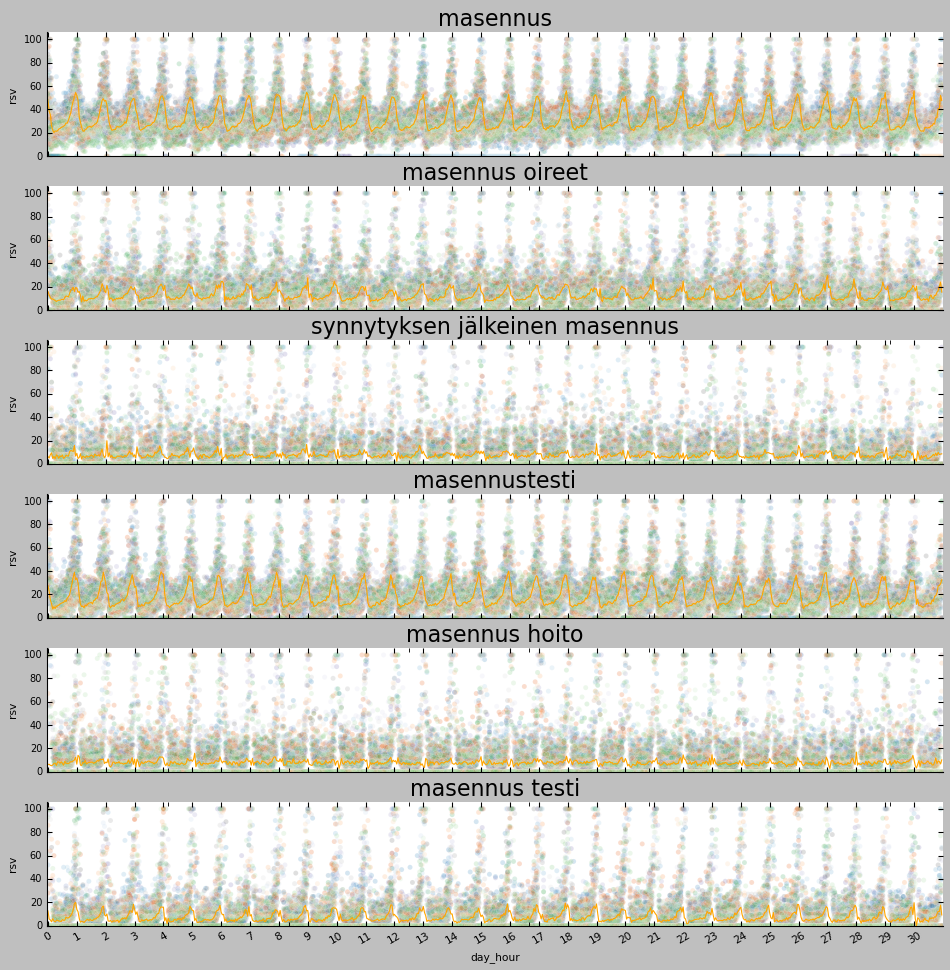

In [115]:
scatter_hourly_terms(df_hourly_monthly, terms,x= 'day_hour', y = 'rsv',col = 'term', subtitles = terms)

### Weekly vs hourly

In [100]:
""" to add a column representing all unique month during the years of the data with an 
integer and then add another columnto indeicate hours  for each day for each 
term and finaly to present it in long view"""
def sorted_all_weeks_hourly(df_agg, term, start_year= 2015, last_year=2020):
    # chnage dtype of the column 'year-month-day' to datetime
    df_agg['year_month_day'] =  pd.to_datetime(df_agg['year_month_day'], format='%Y-%m-%d')
    df_agg['week']= df_agg['week'].astype('int32')
    """make a dictionary for projection of years on values ranging from zero to cover all
    weeks of the years as each each have differnt number of weeks so we first need to 
    obtain the last week of each year"""
    dict_year_proj = {start_year:0}
    for year in range(start_year+1,last_year+1):
    # first year is considered zero to then add to week of the year indicate all weeks during the years of study
        dict_year_proj[year] = df_agg[df_agg['year']==year-1]['week'].max() +  dict_year_proj[year-1]
    # {2015: 0, 2016: 53, 2017: 106, 2018: 158, 2019: 210, 2020: 262}
    # we want to have strat week of Monday so make a mp dictionary to numbers 
#     week_days = ['Mon', 'Tues', 'Wed','Thurs', 'Fri', 'Sat', 'Sun']
#     weekday_dict = {key:value for key,value in zip(week_days, range(1,8))}
    # make a copy of the dataframe
    df_agg1 = df_agg[:]
    # replace year with the values of the projection dictionary
    df_agg1.replace({"year": dict_year_proj}, inplace = True)
    df_agg1['year'] = df_agg1['year'].astype('int32')
    # Add the weekday_number column to the data frame
#     df_agg1['weekday_number'] = df_agg['weekday'].map(weekday_dict)
#     # chanage from categorical to number
#     df_agg1['weekday_number'] = df_agg1['weekday_number'].astype('int32') 
    # add a new columns indication sum of the replaced year and week to have all weeks during the years 
    all_week = (df_agg1['year']+ df_agg1['week'])
    df_agg1.insert(0,'all_week', all_week)
    # add a columns of day-hour which considering weeks of the year makes it a unique record identification
    df_agg1['weekday_hour'] = [f'{d}-{h}' for d,h in zip(df_agg1['weekday'], df_agg1['hour'])]
    names = terms+['all_week','weekday_hour','weekday']
    # as we wan to strat from the beginging of a week we remove first week which might started from the midlle of the week
    df_agg1= df_agg1[df_agg1.week != 1]
    df_g = df_agg1[names]
    # create long view of the dataframe
    n = len(terms)
    df_agg_melted = pd.melt(df_g, id_vars=['all_week','weekday_hour','weekday'], value_vars=df_g.iloc[:,:n], var_name='term', 
                        value_name='rsv', ignore_index=False)

    return df_agg_melted

In [103]:
df_weeks_hourly = sorted_all_weeks_hourly(df_agg, term, start_year= 2015, last_year=2020)
df_weeks_hourly.head()

,all_week,weekday_hour,weekday,term,rsv
date,,,,,
2015-01-05 00:00:00,2,Mon-0,Mon,masennus,36.0
2015-01-05 01:00:00,2,Mon-1,Mon,masennus,66.0
2015-01-05 02:00:00,2,Mon-2,Mon,masennus,50.0
2015-01-05 03:00:00,2,Mon-3,Mon,masennus,38.0
2015-01-05 04:00:00,2,Mon-4,Mon,masennus,37.0


In [122]:
import seaborn as sns
sns.set_context("paper")
def plot_hourly_weekly_terms(df_weeks_hourly, terms,x= 'weekday_hour', y = 'rsv',col = 'term', subtitles = terms):
    g = sns.relplot(data=df_weeks_hourly, x=x, y=y, hue='all_week',
                 col=col, col_wrap=2, 
                palette='tab20c',legend=False, 
                kind='scatter',estimator='mean', height=2, aspect=6, alpha = .3)
    n = len(terms) 
    xlabels = df_weeks_hourly['weekday_hour'].unique()
    g.set_titles(col_template='') 
    #     dataframe of mean of hourly RSV for each term
    df_ = df_weeks_hourly.groupby([col, x],sort=False)[y].mean()
    df_ = df_.unstack()    
    for i,tr in enumerate(terms):
        df_.loc[tr,:].plot.line(ax = g.axes.flatten()[i], color = 'orange', linewidth = '2')     
    for i in range(0,n):
        g.axes.flatten()[i].set_xticks(range(0,7*24,12))
        g.axes.flatten()[i].set_xticklabels(xlabels[::12], rotation = 90, size = 'medium')
        g.axes.flatten()[i].set_title(subtitles[i], fontsize = 20, loc='center',y = 1.01)
        g.axes.flatten()[i].set_ylim(0,106)
        g.axes.flatten()[i].set_xlim(-1,7*24,12)

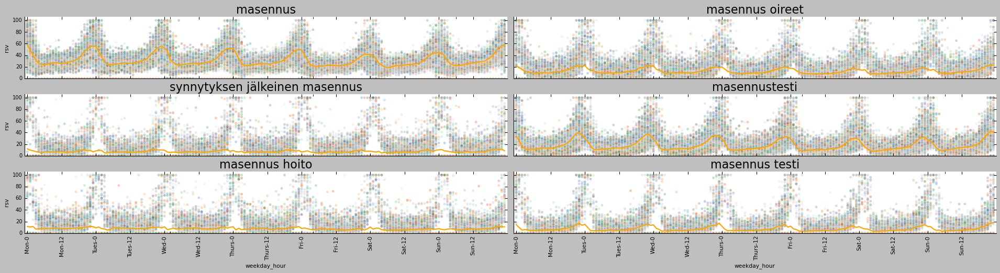

In [123]:
plot_hourly_weekly_terms(df_weeks_hourly, terms,x= 'weekday_hour', y = 'rsv',col = 'term', subtitles = terms)

In [125]:
import seaborn as sns
sns.set_context("paper")
def plot_hourly_weekly_terms(df_weeks_hourly, terms,x= 'weekday_hour', y = 'rsv',col = 'term', subtitles = terms):
    g = sns.relplot(data=df_weeks_hourly, x=x, y=y, hue='all_week',
                 col=col, col_wrap=2, 
                palette='ocean',legend=False, 
                kind='line',estimator='mean', height=2, aspect=5, alpha = .3)
    n = len(terms) 
    xlabels = df_weeks_hourly['weekday_hour'].unique()
    g.set_titles(col_template='') 
    #     dataframe of mean of hourly RSV for each term
    df_ = df_weeks_hourly.groupby([col, x],sort=False)[y].mean()
    df_ = df_.unstack()    
    for i,tr in enumerate(terms):
        df_.loc[tr,:].plot.line(ax = g.axes.flatten()[i], color = 'orange', linewidth = '2')    
    for i in range(0,n):
        g.axes.flatten()[i].set_xticks(range(0,7*24,12))
        g.axes.flatten()[i].set_xticklabels(xlabels[::12], rotation = 90, size = 'medium')
        g.axes.flatten()[i].set_title(subtitles[i], fontsize = 20, loc='center',y = 1.01)
        g.axes.flatten()[i].set_ylim(0,106)
        g.axes.flatten()[i].set_xlim(-1,7*24,12) 

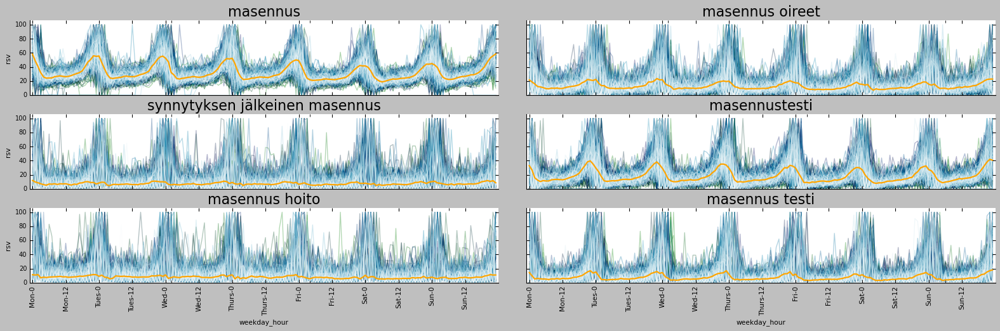

In [126]:
plot_hourly_weekly_terms(df_weeks_hourly, terms,x= 'weekday_hour', y = 'rsv',col = 'term', subtitles = terms)

# yearly plot in 

In [127]:
df_agg.head()

,year,month,day,hour,week,day_month,year_month_day,weekday,masennus,masennus oireet,synnytyksen jälkeinen masennus,masennustesti,masennus hoito,masennus testi
date,,,,,,,,,,,,,,
2015-01-01 00:00:00,2015,Jan,1,0,1,01-Jan,2015-01-01,Thurs,22.0,11.0,0.0,17.0,0.0,0.0
2015-01-01 01:00:00,2015,Jan,1,1,1,01-Jan,2015-01-01,Thurs,18.0,0.0,0.0,12.0,0.0,0.0
2015-01-01 02:00:00,2015,Jan,1,2,1,01-Jan,2015-01-01,Thurs,31.0,12.0,12.0,18.0,0.0,100.0
2015-01-01 03:00:00,2015,Jan,1,3,1,01-Jan,2015-01-01,Thurs,14.0,16.0,0.0,0.0,0.0,0.0
2015-01-01 04:00:00,2015,Jan,1,4,1,01-Jan,2015-01-01,Thurs,8.0,0.0,0.0,0.0,0.0,0.0


In [128]:
terms = terms_first_five
names = terms+['year','year_month_day', 'day_month','hour']
df_g = df_agg[names]
# create long view of the dataframe
n = len(terms)
df_g['year_month_day'] = df_g['year_month_day'].astype('str')
df_g['month_day_hour'] = [f'{d}-{h}' for d,h in zip(df_g['day_month'], df_g['hour'])]

df_agg_melted = pd.melt(df_g, id_vars=['year','month_day_hour','day_month'], value_vars=df_g.iloc[:,:n], var_name='term', 
                        value_name='rsv', ignore_index=False)
df_agg_melted.head()

,year,month_day_hour,day_month,term,rsv
date,,,,,
2015-01-01 00:00:00,2015,01-Jan-0,01-Jan,masennus,22.0
2015-01-01 01:00:00,2015,01-Jan-1,01-Jan,masennus,18.0
2015-01-01 02:00:00,2015,01-Jan-2,01-Jan,masennus,31.0
2015-01-01 03:00:00,2015,01-Jan-3,01-Jan,masennus,14.0
2015-01-01 04:00:00,2015,01-Jan-4,01-Jan,masennus,8.0


In [133]:
import seaborn as sns
sns.set_context("paper")
def plot_hourly_yearly_terms(df_agg_melted, terms,x= 'month_day_hour', y = 'rsv',col = 'term', subtitles = terms):
    g = sns.relplot(data=df_agg_melted, x=x, y=y, hue='year',
                 col=col, col_wrap=1, 
                palette='tab20c',legend=False, 
                kind='scatter',estimator='mean', height=3, aspect=5, alpha = .3)
    n = len(terms) 
    xlabels = df_agg_melted['day_month'].unique()
    g.set_titles(col_template='') 
#     dataframe of mean of hourly RSV for each term
#     df_ = df_agg_melted.groupby([col, x],sort=False)[y].mean()
#     df_ = df_.unstack()    
#     for i,tr in enumerate(terms):
#         df_.loc[tr,:].plot.line(ax = g.axes.flatten()[i], color = 'orange', linewidth = '1')
        
#     print(g.axes[-1].get_xticklabels())     
        
    for i in range(0,n):
        g.axes.flatten()[i].set_xticks(range(0,366*24,144))
        g.axes.flatten()[i].set_xticklabels(xlabels[::6], rotation = 90, size = 'medium')
        g.axes.flatten()[i].set_title(subtitles[i], fontsize = 20, loc='center',y = 1.01)
        g.axes.flatten()[i].set_ylim(0,106)
        g.axes.flatten()[i].set_xlim(-6,366*24,144)
         

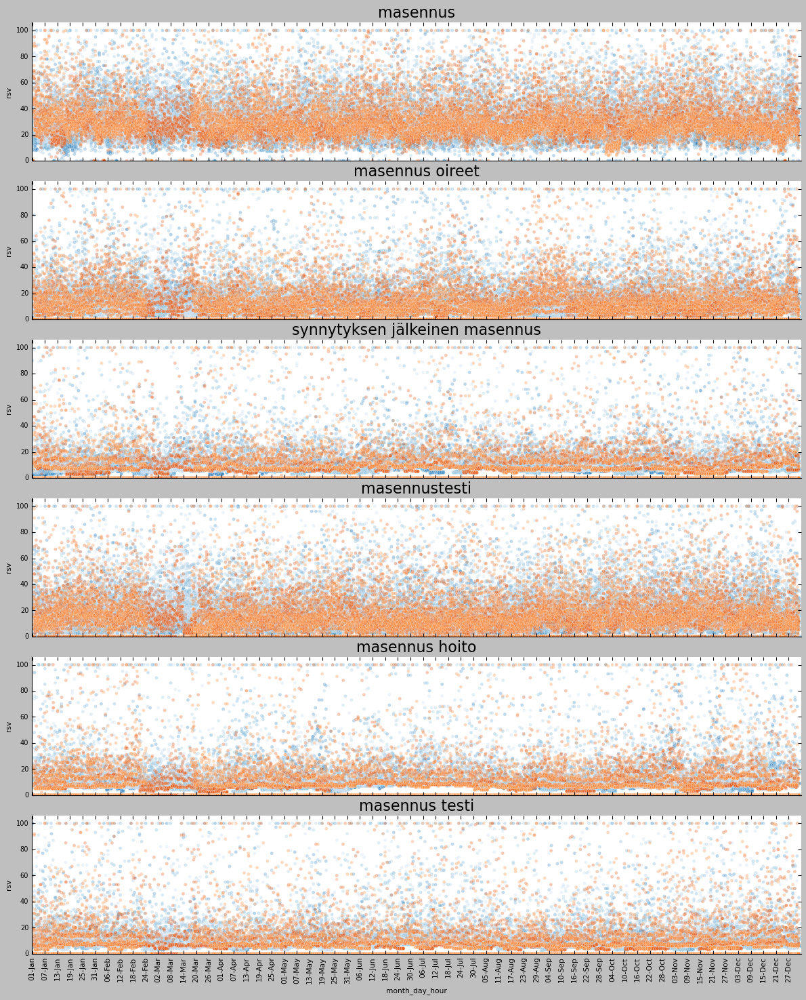

In [134]:
plot_hourly_yearly_terms(df_agg_melted, terms,x= 'month_day_hour', y = 'rsv',col = 'term', subtitles = terms)